In [ ]:
# из библиотеки google.colab импортируем класс files
from google.colab import files

# создаем объект этого класса, применяем метод .upload()
uploaded = files.upload()

Saving VisDrone2019-DET-val.zip to VisDrone2019-DET-val.zip


In [ ]:
!unzip "/content/VisDrone2019-DET-val.zip" -d "/content/dataset"

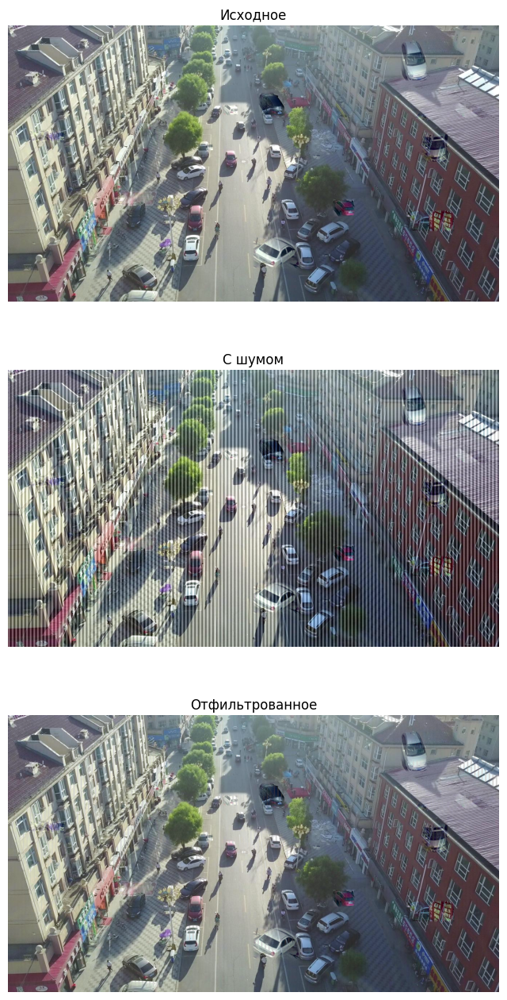

Изображение 1: MSE = 8.349365043495883, SSIM = 0.9921699966018972


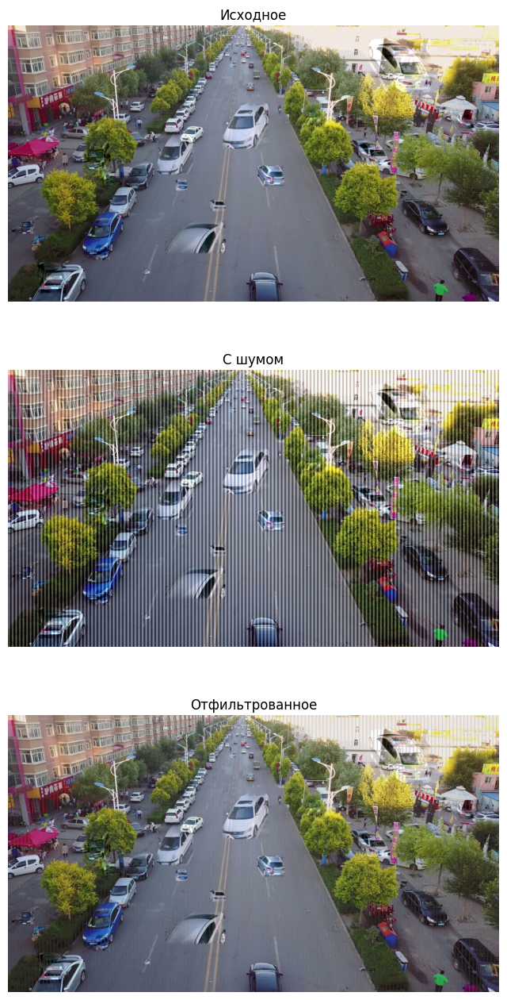

Изображение 2: MSE = 19.914411644015072, SSIM = 0.9734516080677558


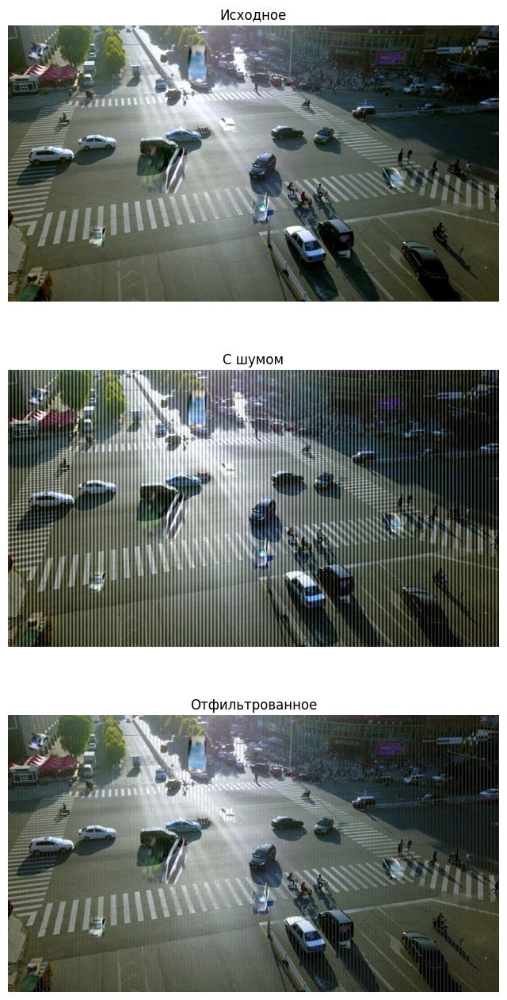

Изображение 3: MSE = 53.34333419224631, SSIM = 0.9211579205079902


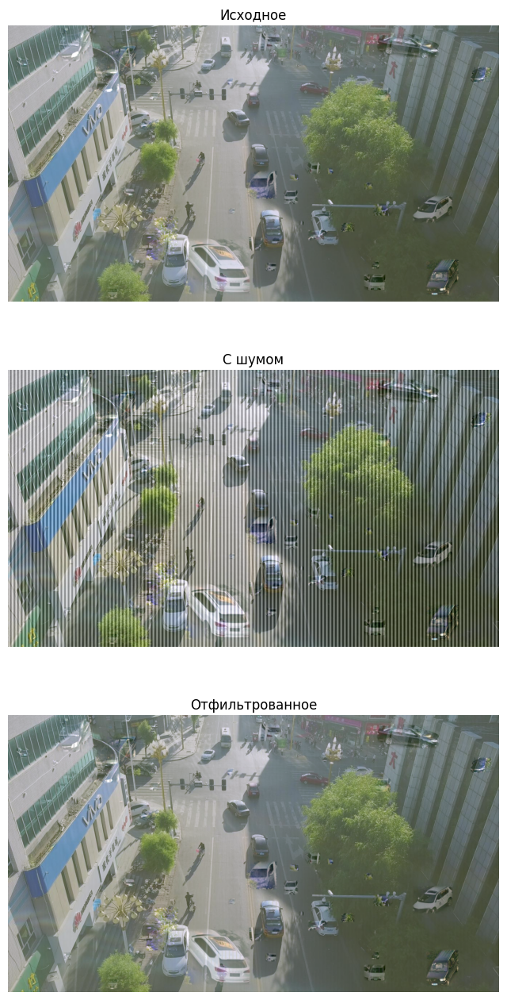

Изображение 4: MSE = 0.7285331282447034, SSIM = 0.998865952295346


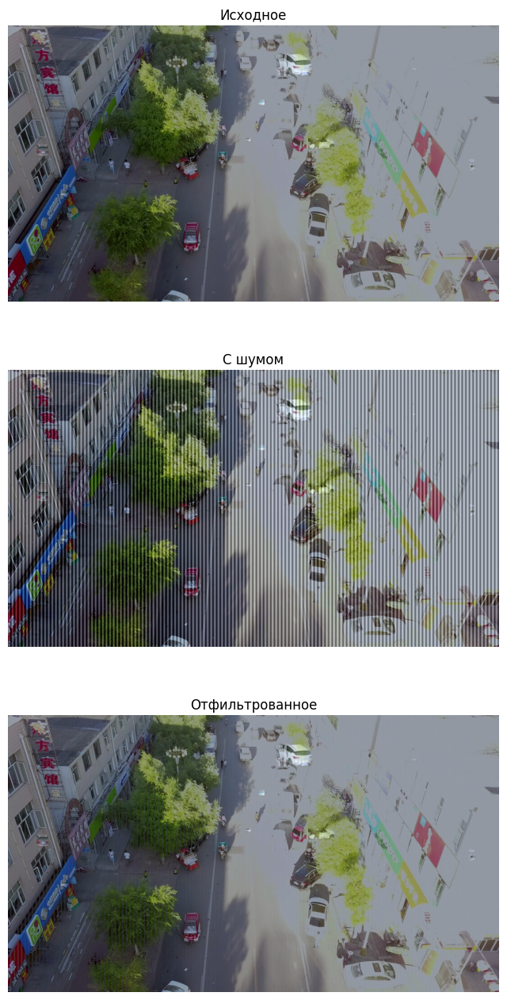

Изображение 5: MSE = 11.026807201316295, SSIM = 0.9848440773181277


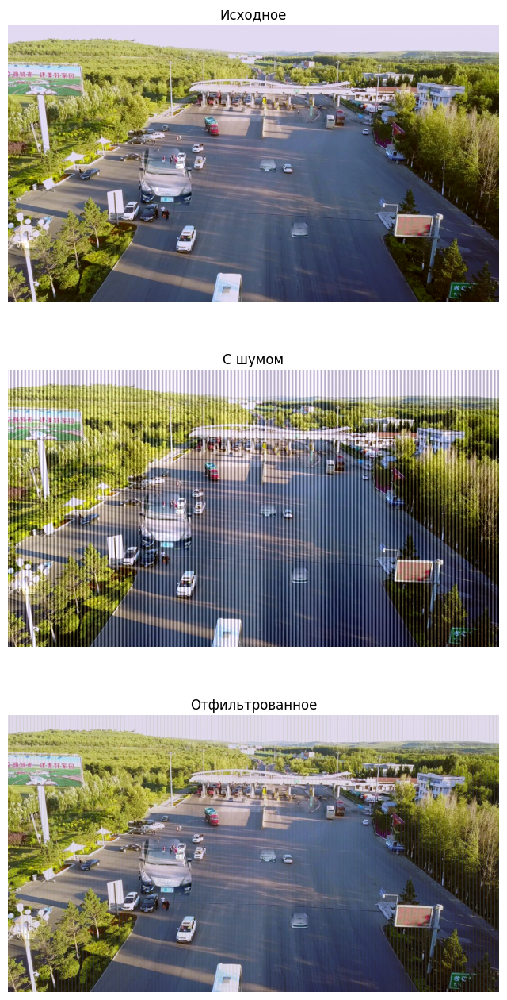

Изображение 6: MSE = 40.272265747469454, SSIM = 0.948529696062455


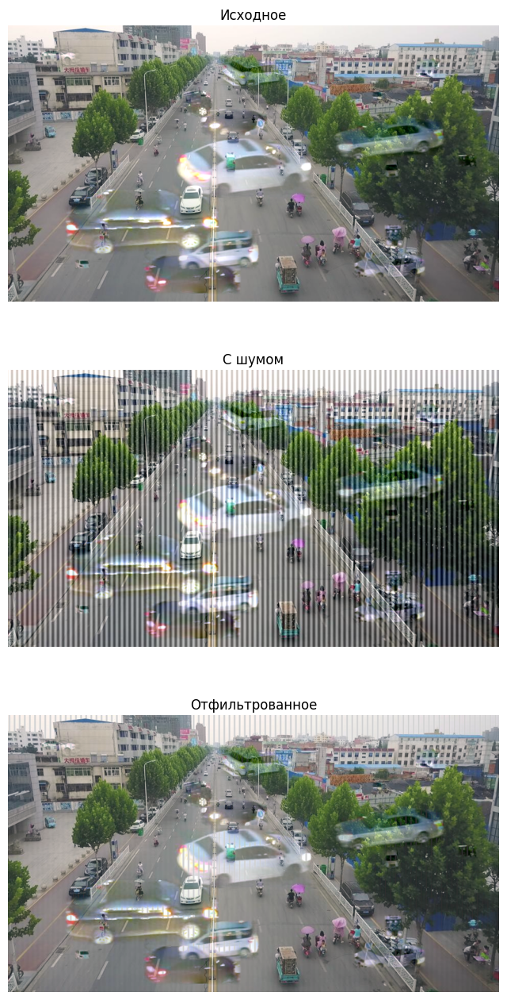

Изображение 7: MSE = 20.45249779333037, SSIM = 0.9742504945661665


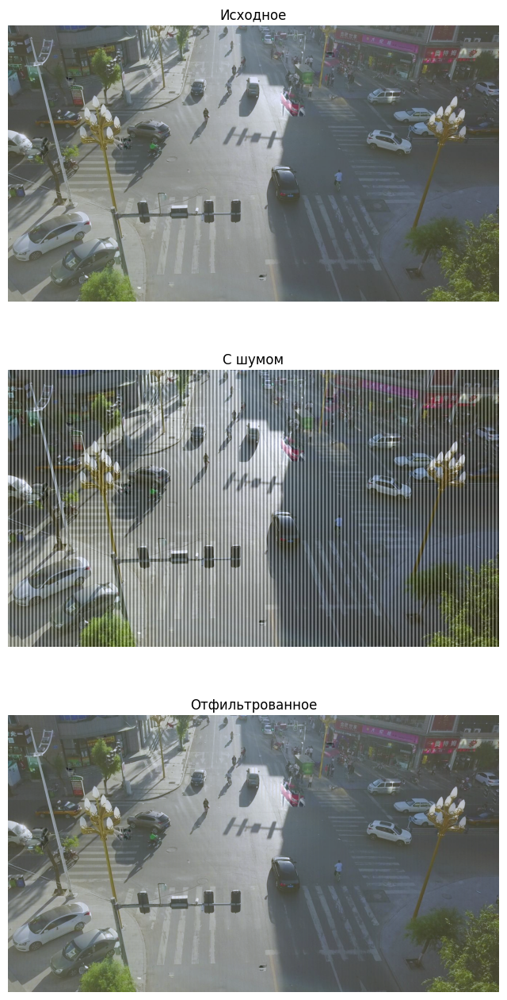

Изображение 8: MSE = 0.580374507433616, SSIM = 0.9988602831485022


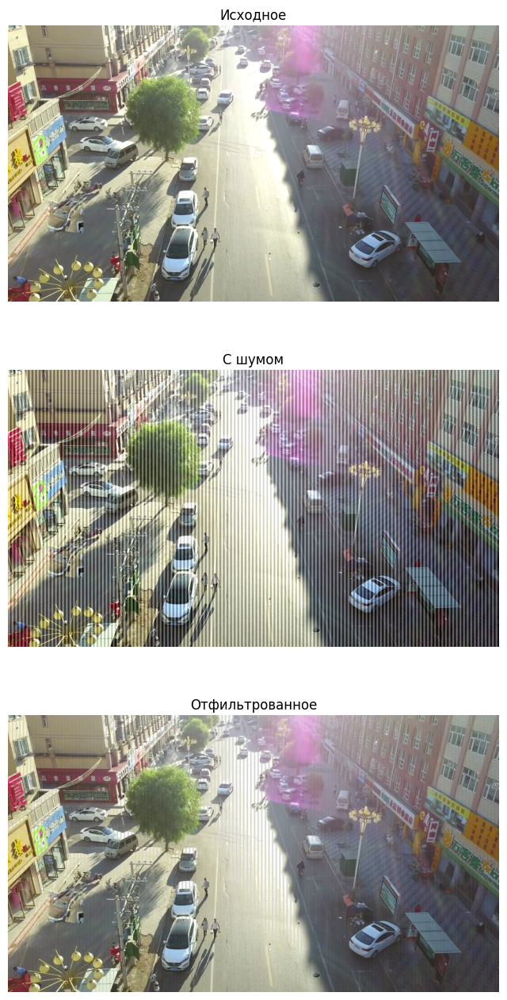

Изображение 9: MSE = 32.4376182186953, SSIM = 0.9707173259576093


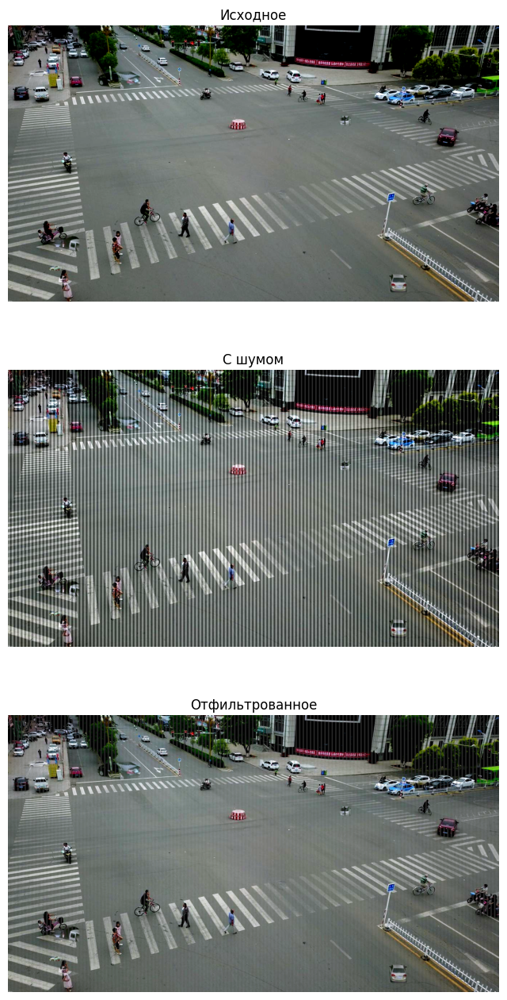

Изображение 10: MSE = 65.55757283077952, SSIM = 0.9242911664364118
Среднее MSE: 25.26627803070265
Среднее SSIM: 0.9687138520962263


In [10]:
from __future__ import annotations

import numpy as np
import cv2
import copy
import os
import random
import torch
from torch.utils.data import Dataset, DataLoader
import matplotlib.pyplot as plt
from skimage.metrics import structural_similarity as compare_ssim

class ChessBoardWildFashionDataset(Dataset):

    def __init__(
        self,
        dataset_size: int,
        visdrone_images_path: str,
        visdrone_annotations_path: str
    ):
        self.dataset_size = dataset_size
        self.images_path = visdrone_images_path
        self.annotations_path = visdrone_annotations_path
        self.image_files = [f for f in os.listdir(self.images_path) if f.endswith(".jpg")]
        self.annotation_files = [f.replace(".jpg", ".txt") for f in self.image_files]

    def __len__(self):
        return self.dataset_size

    def load_image(self, filename):
        return cv2.cvtColor(cv2.imread(os.path.join(self.images_path, filename)), cv2.COLOR_BGR2RGB)

    def load_annotations(self, filename):
        bboxes = []
        with open(os.path.join(self.annotations_path, filename), 'r') as f:
            for line in f.readlines():
                values = list(map(int, line.strip().split(',')))
                x, y, w, h, _, category = values[:6]
                if category == 4:
                    bboxes.append((x, y, x + w, y + h))
        return bboxes

    def compute_color_statistics(self, image):
        mean, std = cv2.meanStdDev(image)
        return mean.flatten(), std.flatten()

    def apply_color_correction(self, src, ref):
        src_mean, src_std = self.compute_color_statistics(src)
        ref_mean, ref_std = self.compute_color_statistics(ref)
        adjusted = ((src - src_mean) * (ref_std / src_std)) + ref_mean
        return np.clip(adjusted, 0, 255).astype(np.uint8)

    def preprocess_images(self, bg, objects):
        ref_image_file = random.choice(self.image_files)
        ref_image = self.load_image(ref_image_file)
        bg = self.apply_color_correction(bg, ref_image)
        objects = [(self.apply_color_correction(obj, ref_image), (x2 - x1, y2 - y1)) for obj, (x1, y1, x2, y2) in objects]
        return bg, objects

    def bbox_area(self, bbox):
        x1, y1, x2, y2 = bbox
        return (x2 - x1) * (y2 - y1)

    def intersection_area(self, box1, box2):
        x1, y1, x2, y2 = box1
        x1_p, y1_p, x2_p, y2_p = box2
        xi1 = max(x1, x1_p)
        yi1 = max(y1, y1_p)
        xi2 = min(x2, x2_p)
        yi2 = min(y2, y2_p)
        return max(0, xi2 - xi1) * max(0, yi2 - yi1)

    def place_objects(self, bg, objects, max_overlap=0.5):
        h, w, _ = bg.shape
        placed_objects = []
        for obj, (ow, oh) in objects:
            scale = random.uniform(0.9, 1.5)
            obj_resized = cv2.resize(obj, (int(ow * scale), int(oh * scale)))
            oh, ow, _ = obj_resized.shape
            placed = False
            for _ in range(50):
                x, y = random.randint(0, w - ow), random.randint(0, h - oh)
                new_bbox = (x, y, x + ow, y + oh)
                if all(self.intersection_area(new_bbox, placed_bbox) < max_overlap * self.bbox_area(new_bbox) and self.intersection_area(new_bbox, placed_bbox) < max_overlap * self.bbox_area(placed_bbox) for placed_bbox in placed_objects):
                    mask = 255 * np.ones(obj_resized.shape, obj_resized.dtype)
                    center = (x + ow // 2, y + oh // 2)
                    try:
                        bg = cv2.seamlessClone(obj_resized, bg, mask, center, cv2.MIXED_CLONE)
                        placed_objects.append(new_bbox)
                        placed = True
                        break
                    except cv2.error as e:
                        print(f"Ошибка при вставке объекта: {e}")
            if not placed:
                print("Не удалось разместить объект без превышения 50% перекрытия.")
        return bg, placed_objects

    def __getitem__(self, idx):
        while True:
            patch_source_file = random.choice(self.image_files)
            annotation_file = patch_source_file.replace(".jpg", ".txt")
            bboxes = self.load_annotations(annotation_file)
            if len(bboxes) > 0:
                break

        while True:
            bg_file = random.choice(self.image_files)
            if bg_file != patch_source_file:
                break

        patch_source = self.load_image(patch_source_file)
        background = self.load_image(bg_file)
        objects = [(patch_source[y1:y2, x1:x2], (x1, y1, x2, y2)) for x1, y1, x2, y2 in bboxes]
        background, objects = self.preprocess_images(background, objects)
        final_image, new_bboxes = self.place_objects(background, objects)
        return torch.FloatTensor(patch_source), torch.tensor(bboxes, dtype=torch.int32), torch.FloatTensor(final_image), torch.tensor(new_bboxes, dtype=torch.int32), len(bboxes)

    def plot_histogram(self, image):
        colors = ('b', 'g', 'r')
        plt.figure(figsize=(6, 4))
        for i, color in enumerate(colors):
            hist = cv2.calcHist([image], [i], None, [256], [0, 256])
            plt.plot(hist, color=color)
            plt.xlim([0, 256])
        plt.title("Гистограмма финального изображения")
        plt.xlabel("Интенсивность")
        plt.ylabel("Частота")
        plt.show()

def add_periodic_noise(image, amplitude=50.0, frequency=0.1):
    image_float = image.copy()  # Assume image is float32 [0,255]
    rows, cols, _ = image_float.shape
    X = np.arange(cols)
    X = np.repeat(X[np.newaxis, :], rows, axis=0)
    noise = amplitude * np.sin(2 * np.pi * frequency * X)
    noise = noise[:, :, np.newaxis]  # (rows, cols, 1)
    noisy_image = image_float + noise
    noisy_image = np.clip(noisy_image, 0, 255)
    return noisy_image

def remove_periodic_noise(image, frequency=0.1):
    def filter_channel(channel):
        F = np.fft.fft2(channel)
        rows, cols = channel.shape
        l1 = round(frequency * cols)
        l2 = (cols - l1) % cols
        F[0, l1] = 0
        F[0, l2] = 0
        filtered = np.fft.ifft2(F).real
        return filtered
    if len(image.shape) == 3:  # RGB
        filtered = np.zeros_like(image)
        for c in range(3):
            filtered[:,:,c] = filter_channel(image[:,:,c])
        return filtered
    else:
        return filter_channel(image)

if __name__ == "__main__":
    dataset = ChessBoardWildFashionDataset(
        dataset_size=10,
        visdrone_images_path="dataset/VisDrone2019-DET-val/images",
        visdrone_annotations_path="dataset/VisDrone2019-DET-val/annotations"
    )

    dataloader = DataLoader(dataset, batch_size=1, shuffle=True)

    mse_list = []
    ssim_list = []

    for i, (patch_img_tensor, bboxes, final_img_tensor, new_bboxes, num_objects) in enumerate(dataloader):
        final_img_clean = final_img_tensor[0].numpy()  # float32 [0,255]
        final_img_noisy = add_periodic_noise(final_img_clean)
        final_img_filtered = remove_periodic_noise(final_img_noisy)
        final_img_clean_uint8 = final_img_clean.astype(np.uint8)
        final_img_noisy_uint8 = final_img_noisy.astype(np.uint8)
        final_img_filtered_uint8 = np.clip(final_img_filtered, 0, 255).astype(np.uint8)

        plt.figure(figsize=(8, 16))
        plt.subplot(3,1,1)
        plt.imshow(final_img_clean_uint8)
        plt.title('Исходное')
        plt.axis('off')

        plt.subplot(3,1,2)
        plt.imshow(final_img_noisy_uint8)
        plt.title('С шумом')
        plt.axis('off')

        plt.subplot(3,1,3)
        plt.imshow(final_img_filtered_uint8)
        plt.title('Отфильтрованное')
        plt.axis('off')
        plt.show()

        mse = np.mean((final_img_filtered - final_img_clean)**2)

        ssim_val = compare_ssim(final_img_clean / 255.0, final_img_filtered / 255.0, multichannel=True, win_size=3, data_range=1.0)
        mse_list.append(mse)
        ssim_list.append(ssim_val)
        print(f"Изображение {i+1}: MSE = {mse}, SSIM = {ssim_val}")

    avg_mse = np.mean(mse_list)
    avg_ssim = np.mean(ssim_list)
    print(f"Среднее MSE: {avg_mse}")
    print(f"Среднее SSIM: {avg_ssim}")